# Die assembly

With gdsfactory you can easily go from a simple Component, to a Component with many references/instances.

## Design for testing

To measure your reticle / die after fabrication you need to decide your test configurations. This includes things like:

- `Individual input and output fibers` versus `fiber array`. We recommend `fiber array` for easier testing and higher throughtput, but also understand the flexibility of single fibers.
- Fiber array pitch (127um or 250um) if using a fiber array.
- Pad pitch for DC and RF high speed probes (100, 125, 150, 200um). Probe configuration (GSG, GS ...)
- Test layout for DC, RF and optical fibers.


To enable automatic testing you can add labels the devices that you want to test. GDS labels are not fabricated and are only visible in the GDS file.

Lets review some different automatic labeling schemas:

1. SiEPIC ubc Ebeam PDK schema, labels only one of the grating couplers from the fiber array.
2. EHVA automatic testers, include a Label component declaration as described in this [doc](https://drive.google.com/file/d/1kbQNrVLzPbefh3by7g2s865bcsA2vl5l/view)
3. Label all ports

### 1. SiEPIC labels

Labels follow format `opt_in_{polarization}_{wavelength}_device_{username}_({component_name})-{gc_index}-{port.name}`

In [1]:
import ipywidgets
from IPython.display import display
from omegaconf import OmegaConf

from gdsfactory.labels import add_label_ehva, add_label_yaml
from gdsfactory.read.labels import add_port_markers
import gdsfactory as gf
from gdsfactory.generic_tech import get_generic_pdk

gf.config.rich_output()
PDK = get_generic_pdk()
PDK.activate()

2023-02-20 17:50:22.605 | INFO     | gdsfactory.config:<module>:50 - Load '/home/runner/work/gdsfactory/gdsfactory/gdsfactory' 6.43.1


2023-02-20 17:50:23.784 | INFO     | gdsfactory.technology.layer_views:__init__:785 - Importing LayerViews from YAML file: /home/runner/work/gdsfactory/gdsfactory/gdsfactory/generic_tech/layer_views.yaml.


2023-02-20 17:50:23.792 | INFO     | gdsfactory.pdk:activate:206 - 'generic' PDK is now active


In [2]:
mmi = gf.components.mmi2x2()
mmi_te_siepic = gf.labels.add_fiber_array_siepic(component=mmi)
mmi_te_siepic

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

mmi2x2_add_fiber_array__39152eff: uid 361eebf7, ports ['opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o1', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o2', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o3', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o4'], references ['add_fiber_array_1'], 0 polygons


In [3]:
mmi_te_siepic.ports

{
    'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o1': Port (name opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o1, center [-23.7 187.7], width 0.5, orientation 0.0, layer (1, 0), port_type optical),
    'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o2': Port (name opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o2, center [-23.7  60.7], width 0.5, orientation 0.0, layer (1, 0), port_type optical),
    'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o3': Port (name opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o3, center [-23.7 -66.3], width 0.5, orientation 0.0, layer (1, 0), port_type optical),
    'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o4': Port (name opt-grating_coupler_ellipti_dd7f7af4-mmi2x2-o4, center [ -23.7 -193.3], width 0.5, orientation 0.0, layer (1, 0), port_type optical)
}

In [4]:
labels = mmi_te_siepic.get_labels()

for label in labels:
    print(label.text)

opt_in_TE_1530_device_YourUserName_(mmi2x2)-1-o1


### 2. EHVA labels

In [5]:
add_label_ehva_demo = gf.partial(add_label_ehva, die="demo_die")
mmi = gf.c.mmi2x2(length_mmi=2.2)
mmi_te_ehva = gf.routing.add_fiber_array(mmi, get_input_labels_function=None, decorator=add_label_ehva_demo)
mmi_te_ehva

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

mmi2x2_length_mmi2p2_ad_ee157c07: uid 4b8ca4da, ports ['opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-o1', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-o2', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-o3', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-o4', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-loopback0', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-loopback1'], references ['bend_euler_1', 'straight_1', 'straight_2', 'bend_euler_2', 'straight_3', 'straight_4', 'bend_euler_3', 'straight_5', 'straight_6', 'bend_euler_4', 'straight_7', 'straight_8', 'bend_euler_5', 'bend_euler_6', 'straight_9', 'straight_10', 'straight_11', 'bend_euler_7', 'bend_euler_8', 'straight_12', 'straight_13', 'straight_14', 'bend_euler_9', 'bend_euler_10', 'straight_15', 'straight_16', 'straight_17', 'bend_euler_11', 'bend_euler_12', 'straight_18', 'straight_19', 'straight_20', 'bend_euler_13', 'bend_euler_14', 'bend_euler_15

In [6]:
labels = mmi_te_ehva.get_labels(depth=0)

for label in labels:
    print(label.text)

DIE NAME:demo_die
CIRCUIT NAME:mmi2x2_length_mmi2p2_ad_ee157c07
CIRCUITINFO NAME: length_mmi, VALUE: 2.2
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-loopback0 TYPE: OPTICALPORT, POSITION RELATIVE:(-316.4, -54.7), ORIENTATION: 90.0
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-o1 TYPE: OPTICALPORT, POSITION RELATIVE:(-189.4, -54.7), ORIENTATION: 90.0
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-o2 TYPE: OPTICALPORT, POSITION RELATIVE:(-62.4, -54.7), ORIENTATION: 90
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-o3 TYPE: OPTICALPORT, POSITION RELATIVE:(64.6, -54.7), ORIENTATION: 90
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-o4 TYPE: OPTICALPORT, POSITION RELATIVE:(191.6, -54.7), ORIENTATION: 90
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi2p2-loopback1 TYPE: OPTICALPORT, POSITION RELATIVE:(318.6, -54.7), ORIE

One advantage of the EHVA formats is that you can track any changes on the components directly from the GDS label, as the label already stores any changes of the child device, as well as any settings that you specify.

Settings can have many levels of hierarchy, but you can still access any children setting with `:` notation.

```
grating_coupler:
    function: grating_coupler_elliptical_trenches
    settings:
        polarization: te
        taper_angle: 35

```

In [7]:
add_label_ehva_demo = gf.partial(
        add_label_ehva,
        die="demo_die",
        metadata_include_parent=["grating_coupler:settings:polarization"],
)
mmi = gf.components.mmi2x2(length_mmi=10)
mmi_te_ehva = gf.routing.add_fiber_array(mmi, get_input_labels_function=None, decorator=add_label_ehva_demo)
mmi_te_ehva

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

mmi2x2_length_mmi10_add_aae6d109: uid 790fd638, ports ['opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-o1', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-o2', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-o3', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-o4', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-loopback0', 'opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-loopback1'], references ['bend_euler_1', 'straight_1', 'straight_2', 'bend_euler_2', 'straight_3', 'straight_4', 'bend_euler_3', 'straight_5', 'straight_6', 'bend_euler_4', 'straight_7', 'straight_8', 'bend_euler_5', 'bend_euler_6', 'straight_9', 'straight_10', 'straight_11', 'bend_euler_7', 'bend_euler_8', 'straight_12', 'straight_13', 'straight_14', 'bend_euler_9', 'bend_euler_10', 'straight_15', 'straight_16', 'straight_17', 'bend_euler_11', 'bend_euler_12', 'straight_18', 'straight_19', 'straight_20', 'bend_euler_13', 'bend_euler_14', 'bend_euler_15', 'be

In [8]:
labels = mmi_te_ehva.get_labels(depth=0)

for label in labels:
    print(label.text)

DIE NAME:demo_die
CIRCUIT NAME:mmi2x2_length_mmi10_add_aae6d109
CIRCUITINFO NAME: length_mmi, VALUE: 10
CIRCUITINFO NAME: grating_coupler_settings_polarization, VALUE: te
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-loopback0 TYPE: OPTICALPORT, POSITION RELATIVE:(-312.5, -54.7), ORIENTATION: 90.0
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-o1 TYPE: OPTICALPORT, POSITION RELATIVE:(-185.5, -54.7), ORIENTATION: 90.0
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-o2 TYPE: OPTICALPORT, POSITION RELATIVE:(-58.5, -54.7), ORIENTATION: 90
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-o3 TYPE: OPTICALPORT, POSITION RELATIVE:(68.5, -54.7), ORIENTATION: 90
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-o4 TYPE: OPTICALPORT, POSITION RELATIVE:(195.5, -54.7), ORIENTATION: 90
OPTICALPORT NAME: opt-grating_coupler_ellipti_dd7f7af4-mmi2x2_length_mmi10-loopbac

## Pack

Lets start with a resistance sweep, where you change the resistance width to measure sheet resistance.

In [9]:
sweep = [gf.components.resistance_sheet(width=width) for width in [1, 10, 100]]
m = gf.pack(sweep)
c = m[0]
c

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

pack_0_413de36b: uid 413de36b, ports ['0_pad1', '0_pad2', '1_pad1', '1_pad2', '2_pad1', '2_pad2'], references ['resistance_sheet_1', 'resistance_sheet_2', 'resistance_sheet_3'], 0 polygons


Then we add spirals with different lengths to measure waveguide propagation loss.

In [10]:
spiral = gf.components.spiral_inner_io_fiber_single()
spiral

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

spiral_inner_io_2a92e51_825ccbf1: uid 17d2fce3, ports ['o2', 'o1'], references ['spiral_inner_io_1', 'bend_euler_1', 'bend_euler_2'], 0 polygons


In [11]:
spiral_te = gf.routing.add_fiber_single(
    gf.functions.rotate(gf.components.spiral_inner_io_fiber_single, 90)
)
spiral_te

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

spiral_inner_io_2a92e51_ecd14920: uid 128f03c8, ports ['opt_te_1530_15-spiral_inner_io_2a92e51b-0-0', 'opt_te_1530_15-spiral_inner_io_2a92e51b-1-0', 'opt_te_1530_15-spiral_inner_io_2a92e51b-loopback1', 'opt_te_1530_15-spiral_inner_io_2a92e51b-loopback2'], references ['move_1', 'grating_coupler_elliptical_trenches_1', 'grating_coupler_elliptical_trenches_2', 'straight_1', 'grating_coupler_elliptical_trenches_3', 'grating_coupler_elliptical_trenches_4'], 0 polygons


In [12]:
# which is equivalent to
spiral_te = gf.compose(
    gf.routing.add_fiber_single,
    gf.functions.rotate90,
    gf.components.spiral_inner_io_fiber_single,
)
c = spiral_te(length=10e3)
c

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

spiral_inner_io_fdc8380_e3832d19: uid cb24339f, ports ['opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', 'opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', 'opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', 'opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2'], references ['move_1', 'grating_coupler_elliptical_trenches_1', 'grating_coupler_elliptical_trenches_2', 'straight_1', 'grating_coupler_elliptical_trenches_3', 'grating_coupler_elliptical_trenches_4'], 0 polygons


In [13]:
add_label_ehva_mpw1 = gf.partial(gf.labels.add_label_ehva, die="mpw1")
add_fiber_single_no_labels = gf.partial(
    gf.routing.add_fiber_single, get_input_label_text_function=None,decorator= add_label_ehva_mpw1,
)

spiral_te = gf.compose(
    add_fiber_single_no_labels,
    gf.functions.rotate90,
    gf.components.spiral_inner_io_fiber_single,
)
sweep = [spiral_te(length=length) for length in [10e3, 20e3, 30e3]]
m = gf.pack(sweep)
c = m[0]
c

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

pack_0_8656d5c5: uid 8656d5c5, ports ['0_opt_te_1530_15-spiral_inner_io_d5fcbb42-0-0', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-1-0', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback1', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback2', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-0-0', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-1-0', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback1', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback2', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2'], references ['add_fiber_single_1', 'add_fiber_single_2', 'add_fiber_single_3'], 0 polygons


Together with GDS labels that are not fabricated, you can also add some physical labels that will be fabricated.

For example you can add prefix `S` at the `north-center` of each spiral using `text_rectangular` which is DRC clean and anchored on `nc` (north-center)

In [14]:
text_metal3 = gf.partial(
    gf.components.text_rectangular_multi_layer, layers=(gf.LAYER.M3,)
)

m = gf.pack(sweep, text=text_metal3, text_anchors=("nc",), text_prefix="s")
c = m[0]
c

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

pack_0_ad8fa71e: uid ad8fa71e, ports ['0_opt_te_1530_15-spiral_inner_io_d5fcbb42-0-0', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-1-0', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback1', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback2', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-0-0', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-1-0', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback1', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback2', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2'], references ['add_fiber_single_1', 'copy_layers_1', 'add_fiber_single_2', 'copy_layers_2', 'add_fiber_single_3', 'copy_layers_3'], 0 polygons


In [15]:
text_metal2 = gf.partial(gf.components.text, layer=gf.LAYER.M2)

m = gf.pack(sweep, text=text_metal2, text_anchors=("nc",), text_prefix="s")
c = m[0]
c

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

pack_0_25c8017d: uid 25c8017d, ports ['0_opt_te_1530_15-spiral_inner_io_d5fcbb42-0-0', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-1-0', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback1', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback2', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-0-0', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-1-0', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback1', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback2', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2'], references ['add_fiber_single_1', 'text_1', 'add_fiber_single_2', 'text_2', 'add_fiber_single_3', 'text_3'], 0 polygons


## Grid

You can also pack components with a constant spacing.

In [16]:
g = gf.grid(sweep)
g

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

grid_bfa05410: uid d4469a5a, ports ['0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2', '1_0_opt_te_1530_15-spiral_inner_io_0f60acb9-0-0', '1_0_opt_te_1530_15-spiral_inner_io_0f60acb9-1-0', '1_0_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback1', '1_0_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback2', '2_0_opt_te_1530_15-spiral_inner_io_d5fcbb42-0-0', '2_0_opt_te_1530_15-spiral_inner_io_d5fcbb42-1-0', '2_0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback1', '2_0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback2'], references ['0_0', '1_0', '2_0'], 0 polygons


In [17]:
gh = gf.grid(sweep, shape=(1, len(sweep)))
gh

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

grid_c5382fe1: uid bbce7fae, ports ['0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-0-0', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-1-0', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback1', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback2', '0_2_opt_te_1530_15-spiral_inner_io_d5fcbb42-0-0', '0_2_opt_te_1530_15-spiral_inner_io_d5fcbb42-1-0', '0_2_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback1', '0_2_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback2'], references ['0_0', '0_1', '0_2'], 0 polygons


In [18]:
gh_ymin = gf.grid(sweep, shape=(1, len(sweep)), align_y="ymin")
gh_ymin

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

grid_a5d0323f: uid 645dad2b, ports ['0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', '0_0_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-0-0', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-1-0', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback1', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback2', '0_2_opt_te_1530_15-spiral_inner_io_d5fcbb42-0-0', '0_2_opt_te_1530_15-spiral_inner_io_d5fcbb42-1-0', '0_2_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback1', '0_2_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback2'], references ['0_0', '0_1', '0_2'], 0 polygons


You can also add text labels to each element of the sweep

In [19]:
gh_ymin = gf.grid_with_text(
    sweep, shape=(1, len(sweep)), align_y="ymin", text=text_metal3
)
gh_ymin

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

grid_with_text_e4bbf485: uid 7a0e24b0, ports [], references ['grid_1', 'copy_layers_1', 'copy_layers_2', 'copy_layers_3'], 0 polygons


You can modify the text by customizing the `text_function` that you pass to `grid_with_text`

In [20]:
gh_ymin_m2 = gf.grid_with_text(
    sweep, shape=(1, len(sweep)), align_y="ymin", text=text_metal2
)
gh_ymin_m2

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

grid_with_text_60c20055: uid 3f702a9a, ports [], references ['grid_1', 'text_1', 'text_2', 'text_3'], 0 polygons


You have 2 ways of defining a mask:

1. in python
2. in YAML


## 1. Component in python

You can define a Component top cell reticle or die using `grid` and `pack` python functions.

In [21]:
text_metal3 = gf.partial(
    gf.components.text_rectangular_multi_layer, layers=(gf.LAYER.M3,)
)
grid = gf.partial(gf.grid_with_text, text=text_metal3)
pack = gf.partial(gf.pack, text=text_metal3)

gratings_sweep = [
    gf.components.grating_coupler_elliptical(taper_angle=taper_angle)
    for taper_angle in [20, 30, 40]
]
gratings = grid(gratings_sweep, text=None)
gratings

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

grid_with_text_f921cf21: uid 0dd8cefc, ports [], references ['grid_1'], 0 polygons


In [22]:
gratings_sweep = [
    gf.components.grating_coupler_elliptical(taper_angle=taper_angle)
    for taper_angle in [20, 30, 40]
]
gratings_loss_sweep = [
    gf.components.grating_coupler_loss_fiber_single(grating_coupler=grating)
    for grating in gratings_sweep
]
gratings = grid(
    gratings_loss_sweep, shape=(1, len(gratings_loss_sweep)), spacing=(40, 0)
)
gratings

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

grid_with_text_5d132578: uid c1a3fff9, ports [], references ['grid_1', 'copy_layers_1', 'copy_layers_2', 'copy_layers_3'], 0 polygons


In [23]:
sweep_resistance = [
    gf.components.resistance_sheet(width=width) for width in [1, 10, 100]
]
resistance = gf.pack(sweep_resistance)[0]
resistance

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

pack_0_cfd5ac99: uid cfd5ac99, ports ['0_pad1', '0_pad2', '1_pad1', '1_pad2', '2_pad1', '2_pad2'], references ['resistance_sheet_1', 'resistance_sheet_2', 'resistance_sheet_3'], 0 polygons


In [24]:
spiral_te = gf.compose(
    gf.routing.add_fiber_single,
    gf.functions.rotate90,
    gf.components.spiral_inner_io_fiber_single,
)
sweep_spirals = [spiral_te(length=length) for length in [10e3, 20e3, 30e3]]
spirals = gf.pack(sweep_spirals)[0]
spirals

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

pack_0_ef58998e: uid ef58998e, ports ['0_opt_te_1530_15-spiral_inner_io_d5fcbb42-0-0', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-1-0', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback1', '0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback2', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-0-0', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-1-0', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback1', '1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback2', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', '2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2'], references ['add_fiber_single_1', 'add_fiber_single_2', 'add_fiber_single_3'], 0 polygons


In [25]:
mask = gf.pack([spirals, resistance, gratings])[0]
mask

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

pack_0_6364e9d1: uid 6364e9d1, ports ['0_0_opt_te_1530_15-spiral_inner_io_d5fcbb42-0-0', '0_0_opt_te_1530_15-spiral_inner_io_d5fcbb42-1-0', '0_0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback1', '0_0_opt_te_1530_15-spiral_inner_io_d5fcbb42-loopback2', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-0-0', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-1-0', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback1', '0_1_opt_te_1530_15-spiral_inner_io_0f60acb9-loopback2', '0_2_opt_te_1530_15-spiral_inner_io_fdc8380c-0-0', '0_2_opt_te_1530_15-spiral_inner_io_fdc8380c-1-0', '0_2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback1', '0_2_opt_te_1530_15-spiral_inner_io_fdc8380c-loopback2', '1_0_pad1', '1_0_pad2', '1_1_pad1', '1_1_pad2', '1_2_pad1', '1_2_pad2'], references ['pack_0_ef58998e_1', 'pack_0_cfd5ac99_1', 'grid_with_text_1'], 0 polygons


As you can see you can define your mask in a single line.

For more complex mask, you can also create a new cell to build up more complexity

In [26]:
@gf.cell
def mask():
    c = gf.Component()
    c << gf.pack([spirals, resistance, gratings])[0]
    c << gf.components.seal_ring(c.bbox)
    return c


c = mask(cache=False)
c

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

mask: uid 5eddb316, ports [], references ['pack_0_4fd061f3_1', 'seal_ring_1'], 0 polygons


## 2. Component in YAML

You can also define your component in YAML format thanks to `gdsfactory.read.from_yaml`

You need to define:

- instances
- placements
- routes (optional)

and you can leverage:

1. `pack_doe`
2. `pack_doe_grid`

### 2.1 pack_doe

`pack_doe` places components as compact as possible

When running this tutorial make sure you UNCOMMENT this line `%matplotlib widget` so you can live update your changes in the YAML file

`# %matplotlib widget`  -> `%matplotlib widget`

In [27]:
# %matplotlib widget

Textarea(value='\nname: mask_grid\n\ninstances:\n  rings:\n    component: pack_doe\n    settings:\n      doe: …

Output()

2023-02-20 17:50:38.702 | INFO     | gdsfactory.technology.layer_views:__init__:785 - Importing LayerViews from YAML file: /home/runner/work/gdsfactory/gdsfactory/gdsfactory/generic_tech/layer_views.yaml.


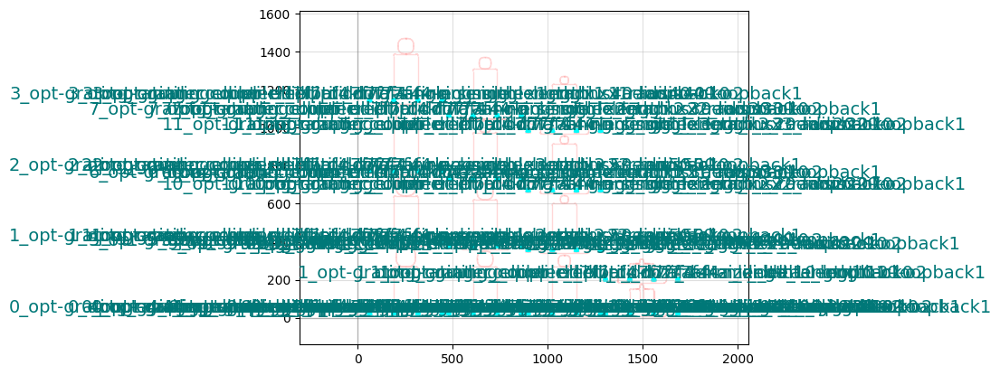

In [28]:
x = ipywidgets.Textarea(rows=20, columns=480)

x.value = """
name: mask_grid

instances:
  rings:
    component: pack_doe
    settings:
      doe: ring_single
      settings:
        radius: [30, 50, 20, 40]
        length_x: [1, 2, 3]
      do_permutations: True
      function:
        function: add_fiber_array
        settings:
            fanout_length: 200

  mzis:
    component: pack_doe
    settings:
      doe: mzi
      settings:
        delta_length: [10, 100]
      function: add_fiber_array

placements:
  rings:
    xmin: 50

  mzis:
    xmin: rings,east
"""

out = ipywidgets.Output()
display(x, out)


def f(change, out=out):
    try:
        c = gf.read.from_yaml(change["new"])
        # clear_output()
        fig = c.plot()
        c.show(show_ports=True)
        out.clear_output()
    except Exception as e:
        out.clear_output()
        with out:
            display(e)


x.observe(f, "value")
f({"new": x.value})

### 2.2 pack_doe_grid

`pack_doe_grid` places each component on a regular grid

2023-02-20 17:50:40.452 | INFO     | gdsfactory.technology.layer_views:__init__:785 - Importing LayerViews from YAML file: /home/runner/work/gdsfactory/gdsfactory/gdsfactory/generic_tech/layer_views.yaml.


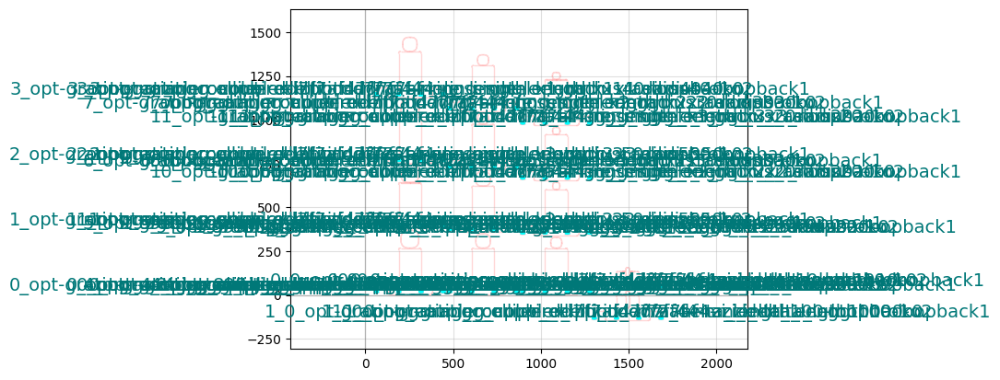

Textarea(value='\nname: mask_compact\n\ninstances:\n  rings:\n    component: pack_doe\n    settings:\n      do…

Output()

In [29]:
x.value = """
name: mask_compact

instances:
  rings:
    component: pack_doe
    settings:
      doe: ring_single
      settings:
        radius: [30, 50, 20, 40]
        length_x: [1, 2, 3]
      do_permutations: True
      function:
        function: add_fiber_array
        settings:
            fanout_length: 200


  mzis:
    component: pack_doe_grid
    settings:
      doe: mzi
      settings:
        delta_length: [10, 100]
      do_permutations: True
      spacing: [10, 10]
      function: add_fiber_array

placements:
  rings:
    xmin: 50

  mzis:
    xmin: rings,east
"""

display(x, out)

## Metadata

When saving GDS files is also convenient to store the metadata settings that you used to generate the GDS file.

In [30]:
import gdsfactory as gf

@gf.cell
def wg():
    c = gf.Component()
    c.info['doe'] = ['rings', 1550, 'te', 'phase_shifter']
    c.info['test_sequence'] = ['optical', 'electrical_sweep']
    c.info['data_analysis'] = ['remove_baseline', 'extract_fsr', 'extract_loss', 'extract_power_per_pi']
    return c

c = wg()
c.pprint()
gdspath = c.write_gds_with_metadata('demo.gds')


{
│   'name': 'wg',
│   'settings': {
│   │   'name': 'wg',
│   │   'module': '__main__',
│   │   'function_name': 'wg',
│   │   'info': {
│   │   │   'doe': ['rings', 1550, 'te', 'phase_shifter'],
│   │   │   'test_sequence': ['optical', 'electrical_sweep'],
│   │   │   'data_analysis': ['remove_baseline', 'extract_fsr', 'extract_loss', 'extract_power_per_pi']
│   │   },
│   │   'info_version': 2,
│   │   'full': {},
│   │   'changed': {},
│   │   'default': {},
│   │   'child': None
│   }
}

2023-02-20 17:50:41.320 | INFO     | gdsfactory.component:_write_library:1704 - Wrote to 'demo.gds'


2023-02-20 17:50:41.328 | INFO     | gdsfactory.component:write_gds_with_metadata:1799 - Write YAML metadata to 'demo.yml'


In [31]:
from IPython.display import Code

metadata = gdspath.with_suffix('.yml')
Code(metadata)

ports : {} 
 cells : 
 wg : 
 name : wg 
 module : __main__ 
 function_name : wg 
 info : 
 doe : 
 - rings 
 - 1550 
 - te 
 - phase_shifter 
 test_sequence : 
 - optical 
 - electrical_sweep 
 data_analysis : 
 - remove_baseline 
 - extract_fsr 
 - extract_loss 
 - extract_power_per_pi 
 info_version : 2 
 full : {} 
 changed : {} 
 default : {} 
 child : null 
 name : wg 
 settings : 
 name : wg 
 module : __main__ 
 function_name : wg 
 info : 
 doe : 
 - rings 
 - 1550 
 - te 
 - phase_shifter 
 test_sequence : 
 - optical 
 - electrical_sweep 
 data_analysis : 
 - remove_baseline 
 - extract_fsr 
 - extract_loss 
 - extract_power_per_pi 
 info_version : 2 
 full : {} 
 changed : {} 
 default : {} 
 child : null

In [32]:
import pandas as pd
from omegaconf import OmegaConf
import gdsfactory as gf

def mzi_te(**kwargs) -> gf.Component:
    gc = gf.c.grating_coupler_elliptical_tm()
    c = gf.c.mzi_phase_shifter_top_heater_metal(delta_length=40)
    c = gf.routing.add_fiber_array(c, grating_coupler=gc, **kwargs)
    c = gf.routing.add_electrical_pads_shortest(c)
    return c

c = mzi_te()
c

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

mzi_6b8f2493_add_fiber__5016c0ce: uid 36fa79c6, ports ['elec-mzi_6b8f2493_add_fiber__dab2b3d7-1', 'elec-mzi_6b8f2493_add_fiber__dab2b3d7-2', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o1', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o2', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback1'], references ['add_fiber_array_1', 'pad_1', 'route_quad_1', 'pad_2', 'route_quad_2'], 0 polygons


In [33]:
c = gf.grid(
    [mzi_te()] * 2,
    decorator=gf.add_labels.add_labels_to_ports,
    add_ports_suffix=True,
    add_ports_prefix=False,
)
gdspath = c.write_gds()
csvpath = gf.labels.write_labels.write_labels_gdstk(gdspath, debug=True)

df = pd.read_csv(csvpath)
c

2023-02-20 17:50:42.239 | INFO     | gdsfactory.component:_write_library:1704 - Wrote to '/tmp/tmp26v5kmen/gdsfactory/grid_9e786ec2.gds'


2023-02-20 17:50:42.243 | INFO     | gdsfactory.labels.write_labels:write_labels_gdstk:146 - Wrote 13 labels to /tmp/tmp26v5kmen/gdsfactory/grid_9e786ec2.csv


opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback0_0_0
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback0_1_0
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o1_0_0
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o1_1_0
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o2_0_0
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o2_1_0
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback1_0_0
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback1_1_0
elec-mzi_6b8f2493_add_fiber__dab2b3d7-1_0_0
elec-mzi_6b8f2493_add_fiber__dab2b3d7-2_0_0
elec-mzi_6b8f2493_add_fiber__dab2b3d7-1_1_0
elec-mzi_6b8f2493_add_fiber__dab2b3d7-2_1_0


AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

grid_9e786ec2: uid b6de771e, ports ['elec-mzi_6b8f2493_add_fiber__dab2b3d7-1_0_0', 'elec-mzi_6b8f2493_add_fiber__dab2b3d7-2_0_0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o1_0_0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o2_0_0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback0_0_0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback1_0_0', 'elec-mzi_6b8f2493_add_fiber__dab2b3d7-1_1_0', 'elec-mzi_6b8f2493_add_fiber__dab2b3d7-2_1_0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o1_1_0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o2_1_0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback0_1_0', 'opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback1_1_0'], references ['0_0', '1_0'], 0 polygons


In [34]:
df

,text,x,y,rotation
0,opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2...,-54.9,233.534,0.0
1,opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2...,-54.9,-89.900,0.0
2,opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2...,72.1,233.534,0.0
3,opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2...,72.1,-89.900,0.0
4,opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2...,199.1,233.534,0.0
5,opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2...,199.1,-89.900,0.0
6,opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2...,326.1,233.534,0.0
7,opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2...,326.1,-89.900,0.0
8,elec-mzi_6b8f2493_add_fiber__dab2b3d7-1_0_0,19.5,446.059,0.0
9,elec-mzi_6b8f2493_add_fiber__dab2b3d7-2_0_0,251.5,446.059,0.0


In [35]:
mzis = [mzi_te()] * 2 
spirals = [gf.routing.add_fiber_array(gf.components.spiral_external_io(length=length)) for length in [10e3, 20e3, 30e3]]

c = gf.pack(
    mzis + spirals,
    add_ports_suffix=True,
    add_ports_prefix=False,
)[0]
c = gf.add_labels.add_labels_to_ports(c)
gdspath = c.write_gds()
csvpath = gf.labels.write_labels.write_labels_gdstk(gdspath, debug=True)
df = pd.read_csv(csvpath)
c

2023-02-20 17:50:43.142 | INFO     | gdsfactory.component:_write_library:1704 - Wrote to '/tmp/tmp62i5fjpp/gdsfactory/pack_0_c9b5d659.gds'


2023-02-20 17:50:43.152 | INFO     | gdsfactory.labels.write_labels:write_labels_gdstk:146 - Wrote 25 labels to /tmp/tmp62i5fjpp/gdsfactory/pack_0_c9b5d659.csv


opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback0_4
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o1_4
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o2_4
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback1_4
opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length10000p0-loopback0_2
opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length10000p0-o2_2
opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length10000p0-o1_2
opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length10000p0-loopback1_2
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-loopback0_3
opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length20000p0-loopback0_1
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o1_3
opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length20000p0-o2_1
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f2493-o2_3
opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length20000p0-o1_1
opt-grating_coupler_ellipti_b6bd8130-mzi_6b8f249

AppLayout(children=(Tab(children=(VBox(children=(HBox(children=(Button(layout=Layout(border_bottom='solid 2px …

pack_0_c9b5d659: uid c9b5d659, ports ['opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length30000p0-o2_0', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length30000p0-o1_0', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length30000p0-loopback0_0', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length30000p0-loopback1_0', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length20000p0-o2_1', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length20000p0-o1_1', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length20000p0-loopback0_1', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length20000p0-loopback1_1', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length10000p0-o2_2', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length10000p0-o1_2', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length10000p0-loopback0_2', 'opt-grating_coupler_ellipti_dd7f7af4-spiral_external_io_length10000p

In [36]:
gdspath = c.write_gds_with_metadata(gdsdir="extra")

2023-02-20 17:50:43.788 | INFO     | gdsfactory.component:_write_library:1704 - Wrote to 'extra/pack_0_c9b5d659.gds'


2023-02-20 17:50:44.588 | INFO     | gdsfactory.component:write_gds_with_metadata:1799 - Write YAML metadata to 'extra/pack_0_c9b5d659.yml'


In [37]:
yaml_path = gdspath.with_suffix(".yml")

In [38]:
labels_path = gf.labels.write_labels.write_labels_gdstk(
    gdspath=gdspath, layer_label=(201, 0)
)

2023-02-20 17:50:44.602 | INFO     | gdsfactory.labels.write_labels:write_labels_gdstk:146 - Wrote 25 labels to /home/runner/work/gdsfactory/gdsfactory/docs/notebooks/extra/pack_0_c9b5d659.csv


In [39]:
mask_metadata = OmegaConf.load(yaml_path)

In [40]:
test_metadata = tm = gf.labels.merge_test_metadata(
    labels_path=labels_path, mask_metadata=mask_metadata
)

In [41]:
tm.keys()

dict_keys(['mzi_6b8f2493', 'spiral_external_io_length10000p0', 'spiral_external_io_length20000p0', 'spiral_external_io_length30000p0', 'mzi_6b8f2493_add_fiber__dab2b3d7'])

```

CSV labels  ------|
                  |--> merge_test_metadata dict
                  |
YAML metadata  ---

```

In [42]:
spiral_names = [s for s in test_metadata.keys() if s.startswith("spiral")]
spiral_names

[
    'spiral_external_io_length10000p0',
    'spiral_external_io_length20000p0',
    'spiral_external_io_length30000p0'
]

In [43]:
spiral_lengths = [
    test_metadata[spiral_name].info.length for spiral_name in spiral_names
]
spiral_lengths

[13003.302, 23003.302, 33003.302]